In [1]:
import torch
import numpy as np
import open3d as o3d

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


### UR5 Controller
#### This part is an example code for real robot control.
#### Please modify this part to suit your experimental environment.

In [2]:
from RealRobot.utils_ur5 import *
from RealRobot.funcs_robot import UR5_ActionController

Failed to import pyassimp, see https://github.com/moveit/moveit/issues/86 for more info


In [3]:
RS = RealSense()
UR5 = UR5Robot(RS)

[ WARN] [1742814901.701181483]: IK plugin for group 'manipulator' relies on deprecated API. Please implement initialize(RobotModel, ...).


Activation completed. Activation time :  1.0882139205932617
T_eef_to_rs: [[-0.99985672  0.01684165  0.00170388  0.03322356]
 [-0.01684719 -0.99985267 -0.00328764  0.04481239]
 [ 0.00164826 -0.00331588  0.99999314  0.07605328]
 [ 0.          0.          0.          1.        ]]


In [4]:
UR5_Control = UR5_ActionController(UR5)
ur5_kin0 = ikfastpy.PyKinematics()

### [Real-to-Sim Phase]

### Step 1: Observe the Initial Workspace
#### Each observation should include "RGB observation", "Camera Intrinsic Parameters", "Calibration Matrix between EEF and camera", and "EEF's position and orientation".
#### You can download the observation data below from "https://drive.google.com/file/d/1kFubcwKMoUMQo5h8NZbI6gZ1pPv78EyH/view?usp=drive_link".

In [5]:
scene_name = "test1_scene"
view_angle_list, view_retrieve_list = UR5_Control.get_view_list(
    x_deg_min=0, x_deg_max=45, y_deg_min=-40, y_deg_max=40
)

* Num Observations: 69


Scene 000
  * RGB Observation:


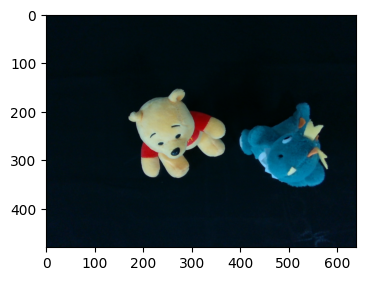

  * EEF POS: (0.069, -0.550, 0.550)
  * EEF QUAT: (-1.000, -0.000, -0.000, 0.000)

Scene 001
  * RGB Observation:


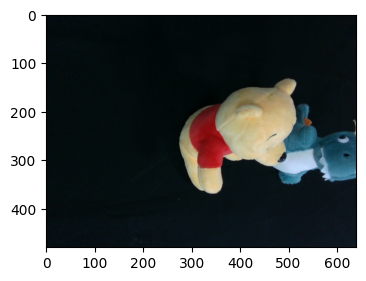

  * EEF POS: (0.382, -0.550, 0.382)
  * EEF QUAT: (0.940, 0.000, -0.343, 0.000)

Scene 002
  * RGB Observation:


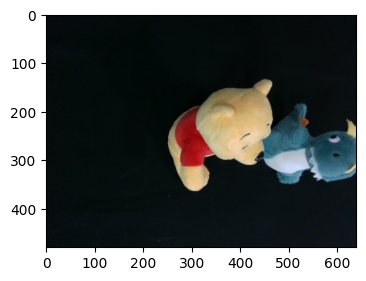

  * EEF POS: (0.347, -0.550, 0.418)
  * EEF QUAT: (-0.954, 0.000, 0.301, 0.000)

Scene 003
  * RGB Observation:


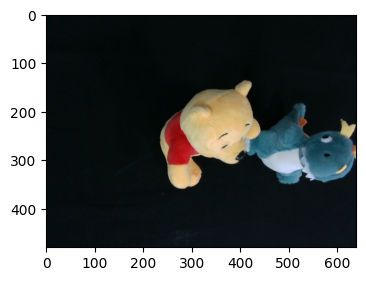

  * EEF POS: (0.311, -0.550, 0.449)
  * EEF QUAT: (-0.966, 0.000, 0.258, 0.000)

Scene 004
  * RGB Observation:


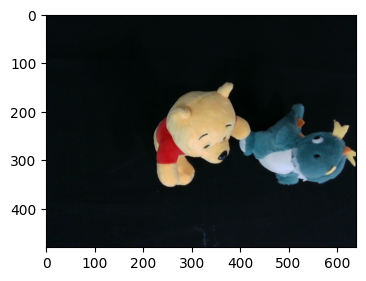

  * EEF POS: (0.273, -0.550, 0.477)
  * EEF QUAT: (0.976, 0.000, -0.216, 0.000)

Scene 005
  * RGB Observation:


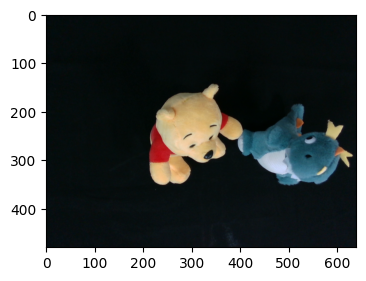

  * EEF POS: (0.233, -0.550, 0.501)
  * EEF QUAT: (0.985, 0.000, -0.173, 0.000)

Scene 006
  * RGB Observation:


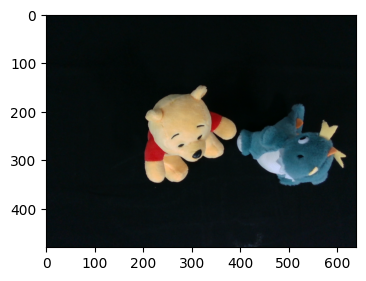

  * EEF POS: (0.193, -0.550, 0.520)
  * EEF QUAT: (0.992, 0.000, -0.130, 0.000)

Scene 007
  * RGB Observation:


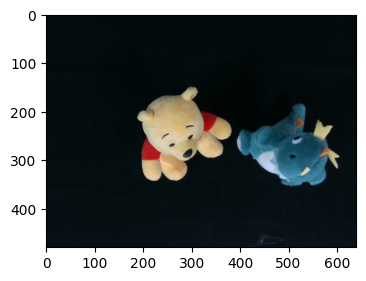

  * EEF POS: (0.152, -0.550, 0.535)
  * EEF QUAT: (0.996, 0.000, -0.087, 0.000)

Scene 008
  * RGB Observation:


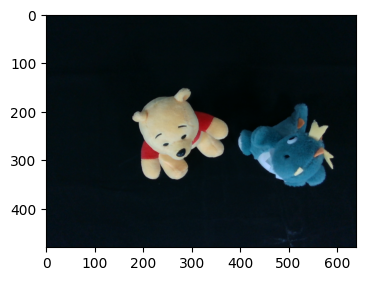

  * EEF POS: (0.111, -0.550, 0.545)
  * EEF QUAT: (0.999, 0.000, -0.043, 0.000)

Scene 009
  * RGB Observation:


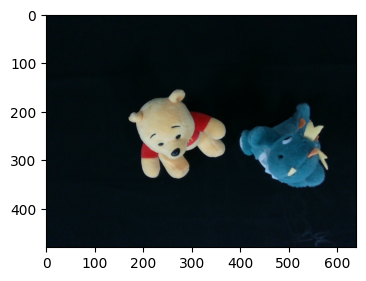

  * EEF POS: (0.069, -0.550, 0.550)
  * EEF QUAT: (1.000, -0.000, 0.000, 0.000)

Scene 010
  * RGB Observation:


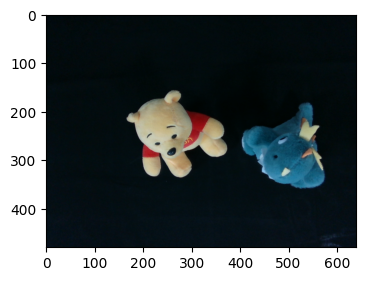

  * EEF POS: (0.028, -0.550, 0.550)
  * EEF QUAT: (-0.999, 0.000, -0.044, 0.000)

Scene 011
  * RGB Observation:


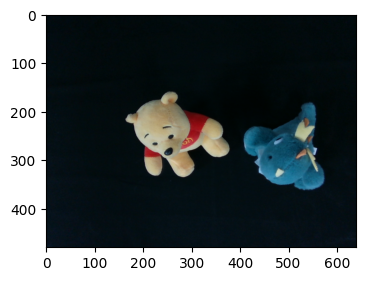

  * EEF POS: (-0.013, -0.550, 0.546)
  * EEF QUAT: (0.996, -0.000, 0.088, 0.000)

Scene 012
  * RGB Observation:


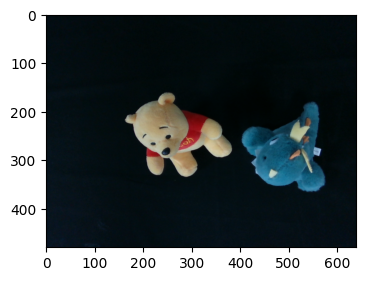

  * EEF POS: (-0.052, -0.550, 0.537)
  * EEF QUAT: (0.991, -0.000, 0.131, 0.000)

Scene 013
  * RGB Observation:


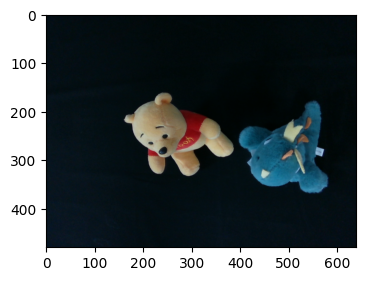

  * EEF POS: (-0.091, -0.550, 0.524)
  * EEF QUAT: (-0.985, -0.000, -0.174, 0.000)

Scene 014
  * RGB Observation:


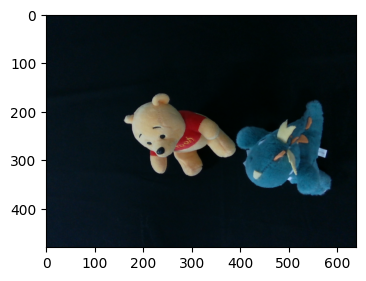

  * EEF POS: (-0.128, -0.550, 0.506)
  * EEF QUAT: (0.976, 0.000, 0.216, 0.000)

Scene 015
  * RGB Observation:


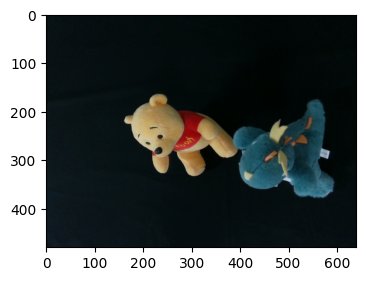

  * EEF POS: (-0.163, -0.550, 0.483)
  * EEF QUAT: (-0.966, -0.000, -0.259, 0.000)

Scene 016
  * RGB Observation:


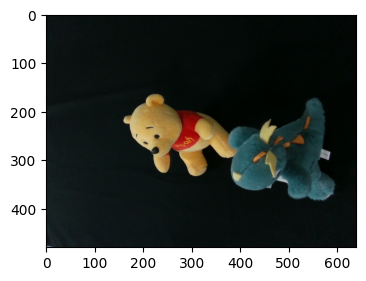

  * EEF POS: (-0.197, -0.550, 0.456)
  * EEF QUAT: (-0.954, -0.000, -0.301, 0.000)

Scene 017
  * RGB Observation:


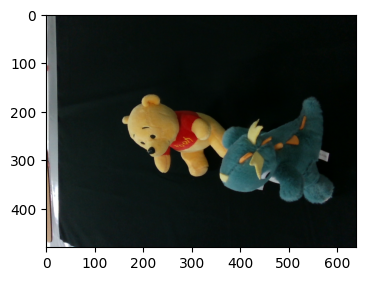

  * EEF POS: (-0.228, -0.550, 0.425)
  * EEF QUAT: (-0.940, -0.000, -0.342, 0.000)

Scene 018
  * RGB Observation:


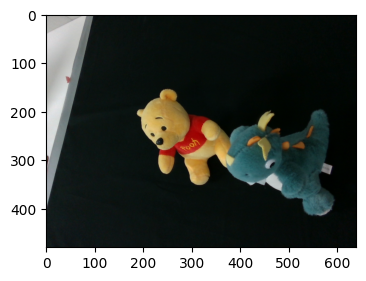

  * EEF POS: (-0.227, -0.463, 0.420)
  * EEF QUAT: (0.932, 0.045, 0.339, 0.123)

Scene 019
  * RGB Observation:


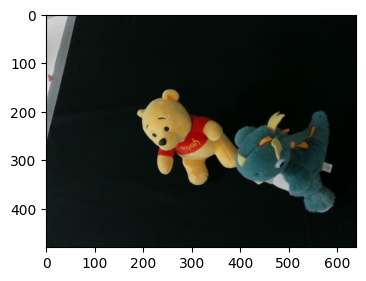

  * EEF POS: (-0.196, -0.456, 0.450)
  * EEF QUAT: (0.946, 0.039, 0.298, 0.124)

Scene 020
  * RGB Observation:


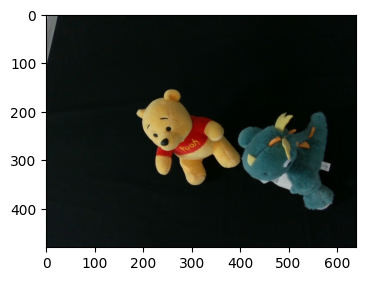

  * EEF POS: (-0.163, -0.450, 0.476)
  * EEF QUAT: (0.958, 0.034, 0.256, 0.126)

Scene 021
  * RGB Observation:


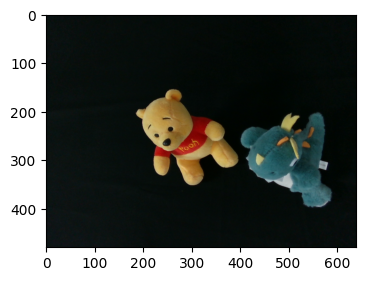

  * EEF POS: (-0.128, -0.444, 0.497)
  * EEF QUAT: (0.968, 0.028, 0.215, 0.127)

Scene 022
  * RGB Observation:


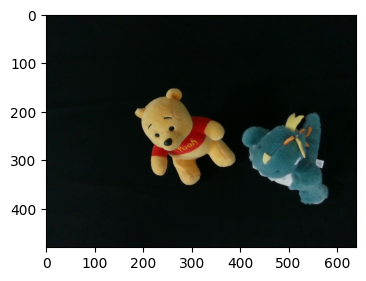

  * EEF POS: (-0.091, -0.440, 0.515)
  * EEF QUAT: (0.976, 0.023, 0.172, 0.128)

Scene 023
  * RGB Observation:


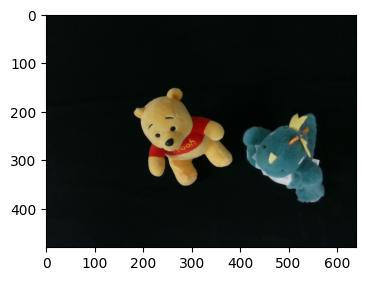

  * EEF POS: (-0.052, -0.436, 0.528)
  * EEF QUAT: (0.983, 0.017, 0.129, 0.130)

Scene 024
  * RGB Observation:


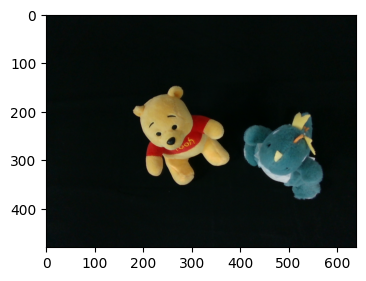

  * EEF POS: (-0.012, -0.433, 0.537)
  * EEF QUAT: (0.988, 0.012, 0.086, 0.130)

Scene 025
  * RGB Observation:


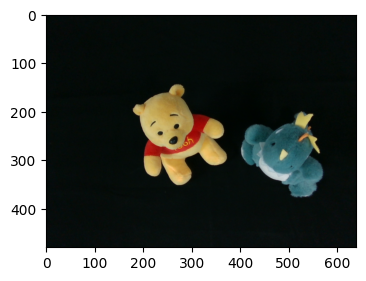

  * EEF POS: (0.028, -0.430, 0.541)
  * EEF QUAT: (0.991, 0.006, 0.043, 0.130)

Scene 026
  * RGB Observation:


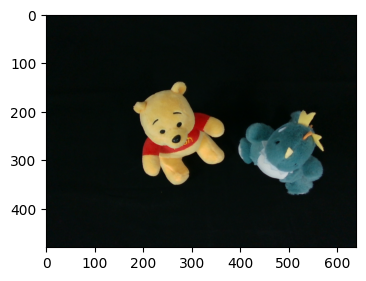

  * EEF POS: (0.070, -0.429, 0.540)
  * EEF QUAT: (0.991, 0.000, 0.000, 0.130)

Scene 027
  * RGB Observation:


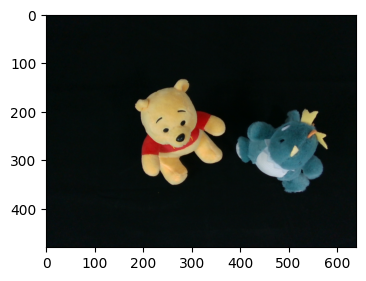

  * EEF POS: (0.111, -0.429, 0.535)
  * EEF QUAT: (0.991, -0.006, -0.043, 0.130)

Scene 028
  * RGB Observation:


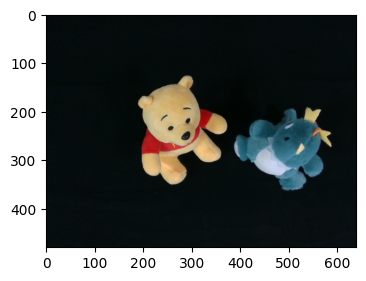

  * EEF POS: (0.152, -0.430, 0.525)
  * EEF QUAT: (0.988, -0.011, -0.087, 0.130)

Scene 029
  * RGB Observation:


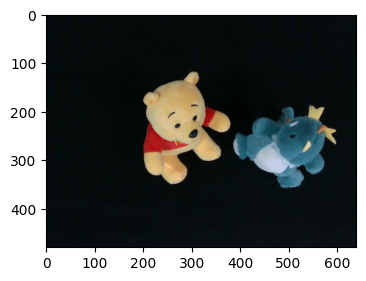

  * EEF POS: (0.193, -0.431, 0.511)
  * EEF QUAT: (0.983, -0.017, -0.129, 0.129)

Scene 030
  * RGB Observation:


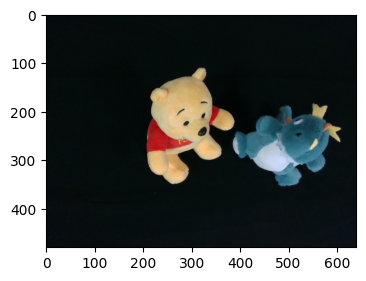

  * EEF POS: (0.234, -0.434, 0.492)
  * EEF QUAT: (0.976, -0.022, -0.173, 0.128)

Scene 031
  * RGB Observation:


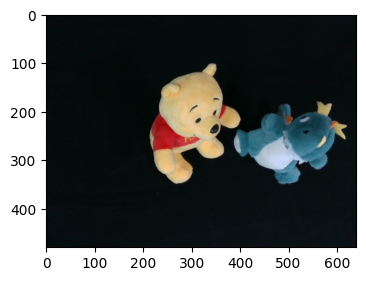

  * EEF POS: (0.273, -0.437, 0.470)
  * EEF QUAT: (0.968, -0.028, -0.214, 0.128)

Scene 032
  * RGB Observation:


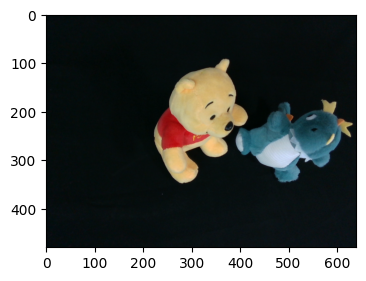

  * EEF POS: (0.311, -0.441, 0.443)
  * EEF QUAT: (0.958, -0.034, -0.256, 0.126)

Scene 033
  * RGB Observation:


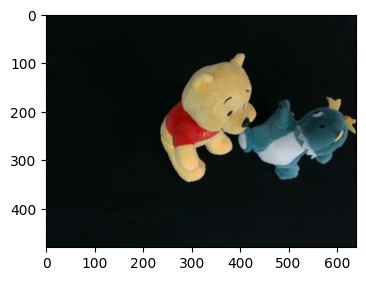

  * EEF POS: (0.348, -0.446, 0.412)
  * EEF QUAT: (0.945, -0.039, -0.299, 0.124)

Scene 034
  * RGB Observation:


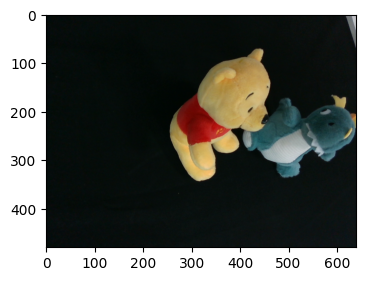

  * EEF POS: (0.382, -0.452, 0.377)
  * EEF QUAT: (0.932, -0.045, -0.339, 0.123)

Scene 035
  * RGB Observation:


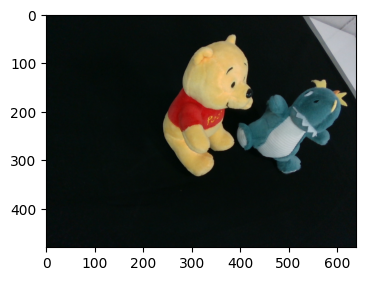

  * EEF POS: (0.382, -0.364, 0.343)
  * EEF QUAT: (0.908, -0.089, -0.330, 0.243)

Scene 036
  * RGB Observation:


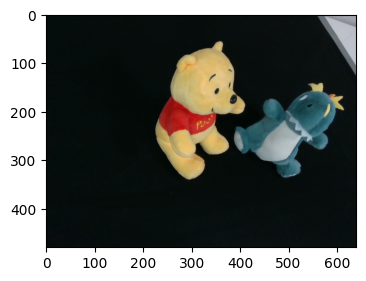

  * EEF POS: (0.347, -0.352, 0.374)
  * EEF QUAT: (0.921, -0.078, -0.291, 0.246)

Scene 037
  * RGB Observation:


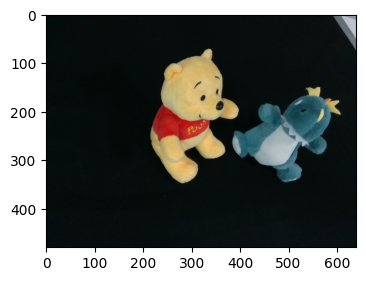

  * EEF POS: (0.311, -0.343, 0.401)
  * EEF QUAT: (0.933, -0.067, -0.250, 0.250)

Scene 038
  * RGB Observation:


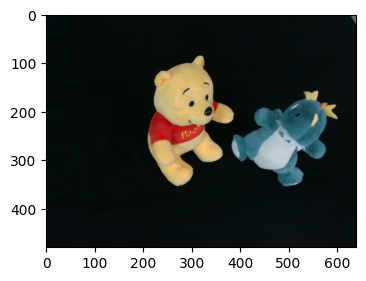

  * EEF POS: (0.273, -0.334, 0.425)
  * EEF QUAT: (0.943, -0.056, -0.209, 0.253)

Scene 039
  * RGB Observation:


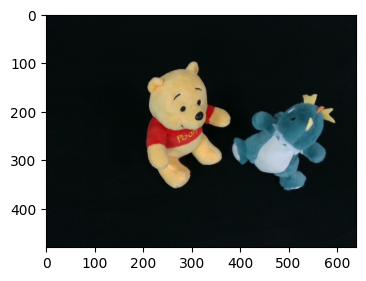

  * EEF POS: (0.233, -0.328, 0.446)
  * EEF QUAT: (0.951, -0.045, -0.168, 0.255)

Scene 040
  * RGB Observation:


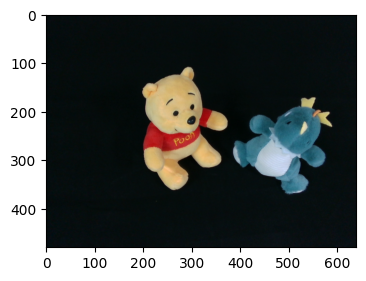

  * EEF POS: (0.193, -0.323, 0.462)
  * EEF QUAT: (0.958, -0.033, -0.126, 0.257)

Scene 041
  * RGB Observation:


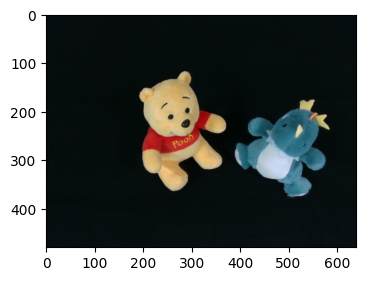

  * EEF POS: (0.152, -0.320, 0.475)
  * EEF QUAT: (0.962, -0.022, -0.084, 0.257)

Scene 042
  * RGB Observation:


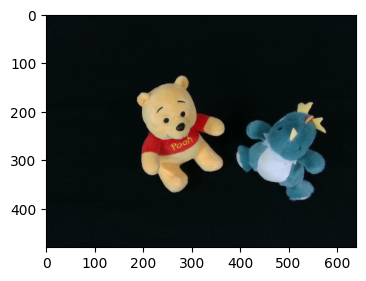

  * EEF POS: (0.111, -0.319, 0.484)
  * EEF QUAT: (0.965, -0.012, -0.042, 0.258)

Scene 043
  * RGB Observation:


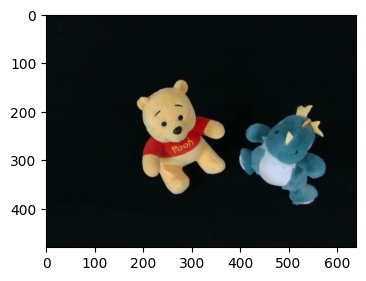

  * EEF POS: (0.069, -0.319, 0.488)
  * EEF QUAT: (0.966, 0.000, 0.000, 0.259)

Scene 044
  * RGB Observation:


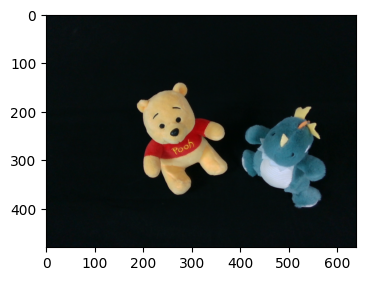

  * EEF POS: (0.028, -0.322, 0.489)
  * EEF QUAT: (0.965, 0.011, 0.043, 0.259)

Scene 045
  * RGB Observation:


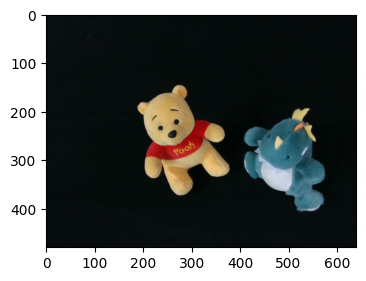

  * EEF POS: (-0.013, -0.326, 0.485)
  * EEF QUAT: (0.962, 0.023, 0.084, 0.258)

Scene 046
  * RGB Observation:


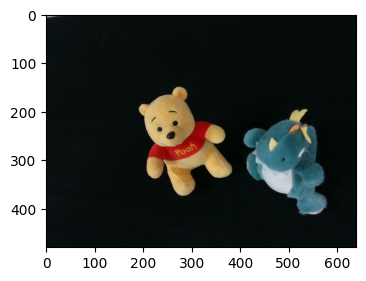

  * EEF POS: (-0.052, -0.332, 0.477)
  * EEF QUAT: (0.958, 0.034, 0.126, 0.257)

Scene 047
  * RGB Observation:


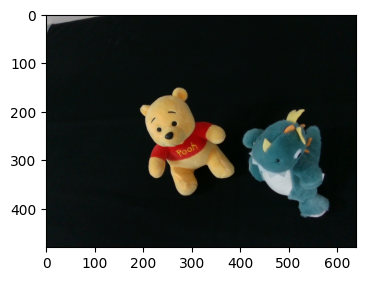

  * EEF POS: (-0.091, -0.339, 0.466)
  * EEF QUAT: (0.951, 0.045, 0.168, 0.255)

Scene 048
  * RGB Observation:


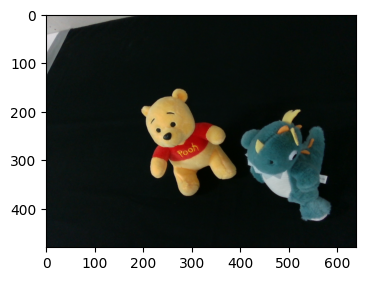

  * EEF POS: (-0.128, -0.349, 0.450)
  * EEF QUAT: (0.943, 0.056, 0.209, 0.253)

Scene 049
  * RGB Observation:


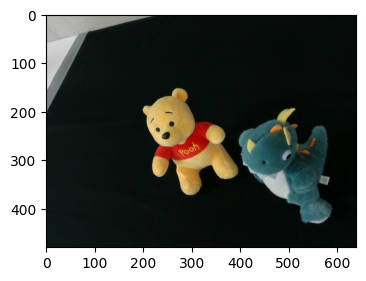

  * EEF POS: (-0.163, -0.359, 0.430)
  * EEF QUAT: (0.933, 0.068, 0.250, 0.250)

Scene 050
  * RGB Observation:


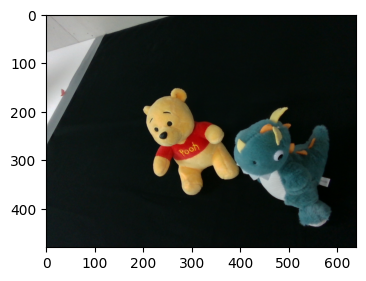

  * EEF POS: (-0.196, -0.372, 0.407)
  * EEF QUAT: (0.921, 0.078, 0.291, 0.247)

Scene 051
  * RGB Observation:


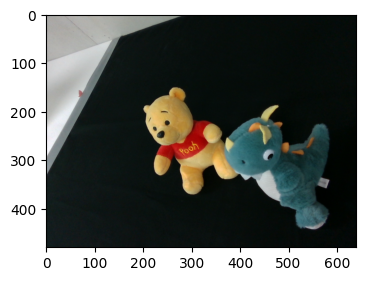

  * EEF POS: (-0.227, -0.386, 0.380)
  * EEF QUAT: (0.908, 0.088, 0.330, 0.243)

Scene 052
  * RGB Observation:


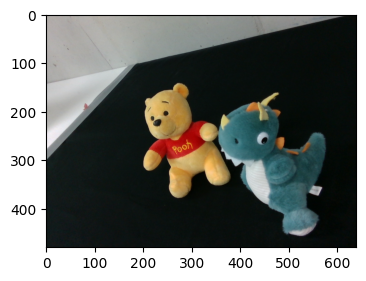

  * EEF POS: (-0.227, -0.322, 0.310)
  * EEF QUAT: (0.868, 0.131, 0.316, 0.360)

Scene 053
  * RGB Observation:


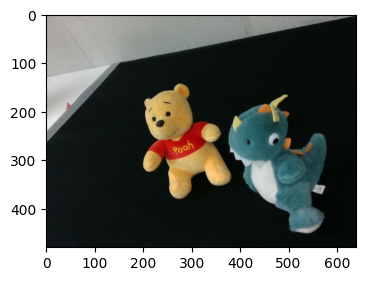

  * EEF POS: (-0.196, -0.303, 0.332)
  * EEF QUAT: (0.881, 0.115, 0.278, 0.365)

Scene 054
  * RGB Observation:


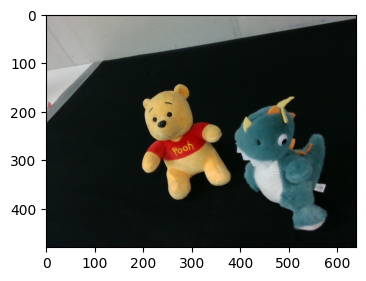

  * EEF POS: (-0.163, -0.285, 0.351)
  * EEF QUAT: (0.892, 0.099, 0.239, 0.369)

Scene 055
  * RGB Observation:


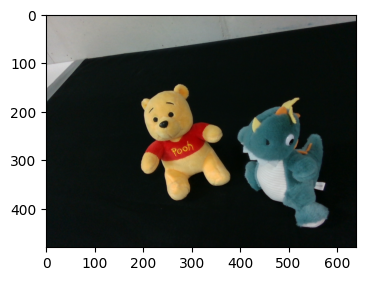

  * EEF POS: (-0.128, -0.270, 0.367)
  * EEF QUAT: (0.902, 0.083, 0.200, 0.373)

Scene 056
  * RGB Observation:


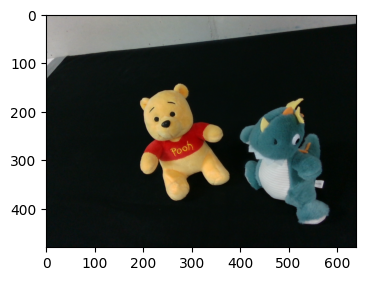

  * EEF POS: (-0.091, -0.257, 0.380)
  * EEF QUAT: (0.910, 0.067, 0.161, 0.377)

Scene 057
  * RGB Observation:


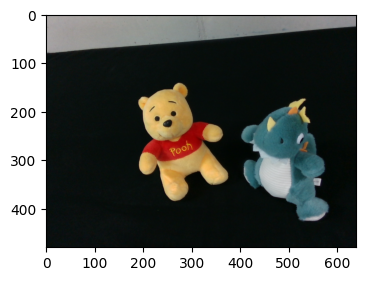

  * EEF POS: (-0.052, -0.246, 0.389)
  * EEF QUAT: (0.916, 0.050, 0.120, 0.380)

Scene 058
  * RGB Observation:


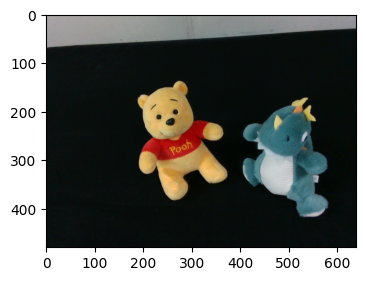

  * EEF POS: (-0.012, -0.237, 0.395)
  * EEF QUAT: (0.920, 0.033, 0.081, 0.381)

Scene 059
  * RGB Observation:


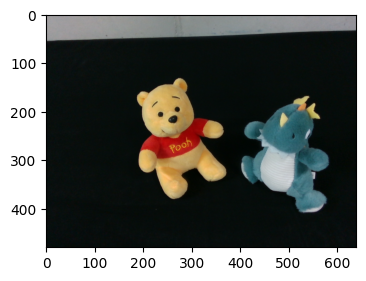

  * EEF POS: (0.028, -0.232, 0.398)
  * EEF QUAT: (0.923, 0.017, 0.040, 0.382)

Scene 060
  * RGB Observation:


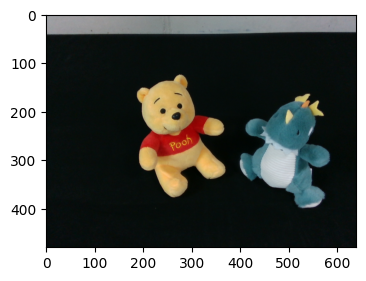

  * EEF POS: (0.069, -0.228, 0.398)
  * EEF QUAT: (0.924, 0.001, 0.000, 0.382)

Scene 061
  * RGB Observation:


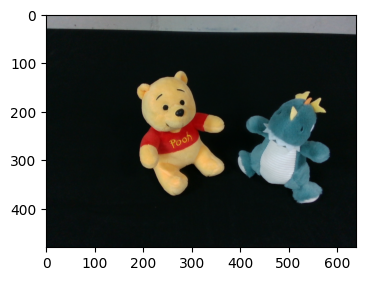

  * EEF POS: (0.111, -0.227, 0.394)
  * EEF QUAT: (0.923, -0.017, -0.040, 0.382)

Scene 062
  * RGB Observation:


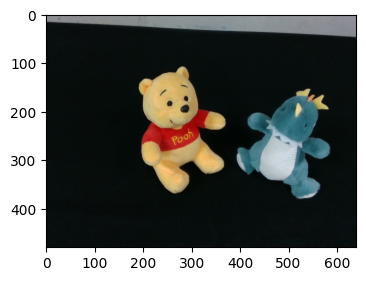

  * EEF POS: (0.152, -0.229, 0.387)
  * EEF QUAT: (0.920, -0.033, -0.080, 0.381)

Scene 063
  * RGB Observation:


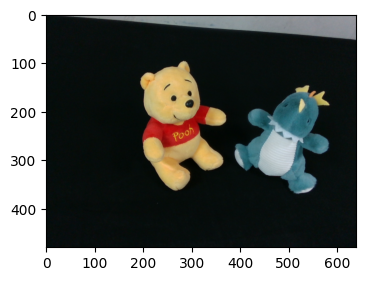

  * EEF POS: (0.193, -0.233, 0.377)
  * EEF QUAT: (0.916, -0.050, -0.121, 0.379)

Scene 064
  * RGB Observation:


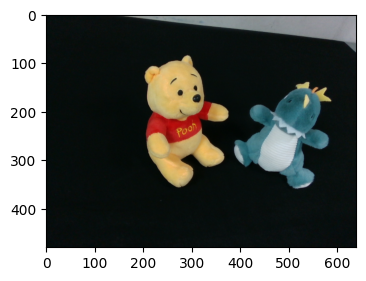

  * EEF POS: (0.234, -0.240, 0.363)
  * EEF QUAT: (0.910, -0.067, -0.160, 0.377)

Scene 065
  * RGB Observation:


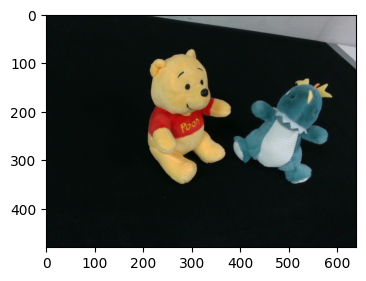

  * EEF POS: (0.273, -0.249, 0.346)
  * EEF QUAT: (0.902, -0.083, -0.200, 0.373)

Scene 066
  * RGB Observation:


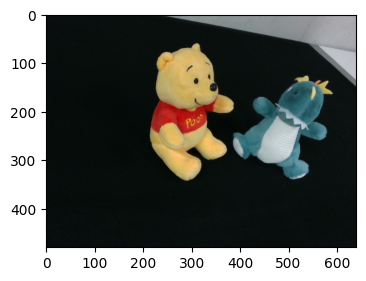

  * EEF POS: (0.311, -0.261, 0.327)
  * EEF QUAT: (0.892, -0.099, -0.239, 0.370)

Scene 067
  * RGB Observation:


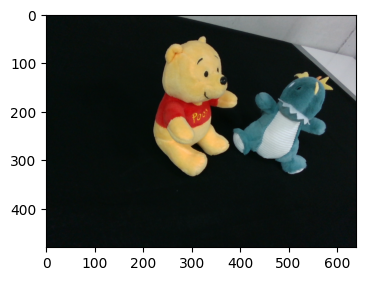

  * EEF POS: (0.347, -0.275, 0.304)
  * EEF QUAT: (0.881, -0.115, -0.278, 0.365)

Scene 068
  * RGB Observation:


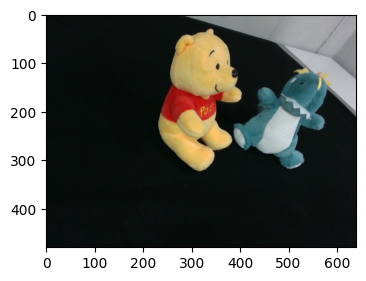

  * EEF POS: (0.382, -0.291, 0.279)
  * EEF QUAT: (0.868, -0.131, -0.316, 0.359)



In [6]:
UR5_Control.observe_scene(scene_name+"1", view_angle_list, view_retrieve_list, print_result=True)

### Step 2: Generate Object Point Clouds
#### (Input) Observed Images  =>  (Output) Point Clouds & 3D Textured Meshes

In [7]:
from generate_pointcloud import scene_processing, generate_pointcloud

[ INFO] [1742814901.673388163]: Loading robot model 'ur5_robot'...
[ INFO] [1742814901.701997774]: IK Using joint shoulder_link -6.28319 6.28319
[ INFO] [1742814901.702005726]: IK Using joint upper_arm_link -6.28319 6.28319
[ INFO] [1742814901.702009141]: IK Using joint forearm_link -3.14159 3.14159
[ INFO] [1742814901.702012215]: IK Using joint wrist_1_link -6.28319 6.28319
[ INFO] [1742814901.702015366]: IK Using joint wrist_2_link -6.28319 6.28319
[ INFO] [1742814901.702018318]: IK Using joint wrist_3_link -6.28319 6.28319
[ INFO] [1742814901.702022747]: Looking in common namespaces for param name: manipulator/position_only_ik
[ INFO] [1742814901.702301150]: Looking in common namespaces for param name: manipulator/solve_type
[ INFO] [1742814901.702690565]: Using solve type Distance
[ INFO] [1742814902.706371954]: Ready to take commands for planning group manipulator.


In [8]:
sfm_type = "colmap" # {robot, colmap}
merge_type = "lepard"
dataset_path = "./Dataset"

In [ ]:
scene_num = 1
# RGBs => Masks
num_objects = scene_processing( 
    scene_name, scene_num,
    sfm_type=sfm_type,
    dataset_path=dataset_path,
)

In [10]:
# RGBs + Masks + Camera Infos => Object Point-Clouds
target_pointclouds = generate_pointcloud( 
        scene_name, scene_num, num_objects,
        pointcloud_name="origin_points",
        dataset_path=dataset_path,
)

Output folder: ./Dataset/test1_scene1/object_1


/home/ur-plusle/virtuals/real2sim_env/lib/python3.10/site-packages/torch/utils/cpp_extension.py:1964: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


Found camera.npz file, assuming IDR data format!
Generating random point cloud (1000000)...
Loading cameras: 69 for training and 0 for testing
Number of points at initialisation :  1000000


/home/ur-plusle/minjae/ARIC_Code/References/Gaussian_Surfels/utils/general_utils.py:158: UserWarning: Using torch.cross without specifying the dim arg is deprecated.
Please either pass the dim explicitly or simply use torch.linalg.cross.
The default value of dim will change to agree with that of linalg.cross in a future release. (Triggered internally at ../aten/src/ATen/native/Cross.cpp:62.)
  R1 = torch.cross(n, R0)
Training progress: 100%|█████████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [00:36<00:00, 136.67it/s, Loss=0.0032370, Pts=15626]



[ITER 5000] Evaluating train: L1 0.003040639580123954 PSNR 34.32176526387532

[ITER 5000] Saving Gaussians
Looking for config file in ./Dataset/test1_scene1/object_1/cfg_args
Config file found: ./Dataset/test1_scene1/object_1/cfg_args
Loading trained model at iteration 5000 [24/03 20:19:41]
Found camera.npz file, assuming IDR data format! [24/03 20:19:41]
Generating random point cloud (1000000)... [24/03 20:19:41]
Loading cameras: 69 for training and 0 for testing [24/03 20:19:41]


Rendering progress: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 69/69 [00:15<00:00,  4.48it/s]


POINTS: torch.Size([1332967, 9]) [24/03 20:19:57]


Mesh cleaning: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:05<00:00,  1.28s/it]


Output folder: ./Dataset/test1_scene1/object_2 [24/03 20:20:02]
Found camera.npz file, assuming IDR data format! [24/03 20:20:02]
Generating random point cloud (1000000)... [24/03 20:20:02]
Loading cameras: 69 for training and 0 for testing [24/03 20:20:02]
Number of points at initialisation :  1000000 [24/03 20:20:03]


Training progress: 100%|█████████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [00:35<00:00, 139.38it/s, Loss=0.0034841, Pts=15916]



[ITER 5000] Evaluating train: L1 0.003442728348697225 PSNR 33.24358452690972 [24/03 20:20:39]

[ITER 5000] Saving Gaussians [24/03 20:20:39]
Looking for config file in ./Dataset/test1_scene1/object_2/cfg_args [24/03 20:20:39]
Config file found: ./Dataset/test1_scene1/object_2/cfg_args [24/03 20:20:39]
Loading trained model at iteration 5000 [24/03 20:20:39] [24/03 20:20:39]
Found camera.npz file, assuming IDR data format! [24/03 20:20:39] [24/03 20:20:39]
Generating random point cloud (1000000)... [24/03 20:20:39] [24/03 20:20:39]
Loading cameras: 69 for training and 0 for testing [24/03 20:20:39] [24/03 20:20:39]


Rendering progress: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 69/69 [00:14<00:00,  4.89it/s]


POINTS: torch.Size([1570503, 9]) [24/03 20:20:54] [24/03 20:20:54]


Mesh cleaning: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:03<00:00,  1.19it/s]

 [24/03 20:20:57] [24/03 20:20:57]
Generating Results: test1_scene1 [24/03 20:20:57] [24/03 20:20:57]
* Object1-Score: 0.650 [24/03 20:20:57] [24/03 20:20:57]
* Object2-Score: 0.678 [24/03 20:20:57] [24/03 20:20:57]


Similar Triangles face sampling
Similar Triangles face sampling
Scene 000 [24/03 20:22:18] [24/03 20:22:18]
  * RGB Observation: [24/03 20:22:18] [24/03 20:22:18]
  * EEF POS: (0.069, -0.550, 0.550) [24/03 20:22:18] [24/03 20:22:18]
  * EEF QUAT: (-1.000, 0.000, 0.000, 0.000) [24/03 20:22:18] [24/03 20:22:18]
 [24/03 20:22:18] [24/03 20:22:18]
Scene 001 [24/03 20:22:21] [24/03 20:22:21]
  * RGB Observation: [24/03 20:22:21] [24/03 20:22:21]
  * EEF POS: (0.382, -0.550, 0.382) [24/03 20:22:21] [24/03 20:22:21]
  * EEF QUAT: (0.940, 0.000, -0.342, 0.000) [24/03 20:22:21] [24/03 20:22:21]
 [24/03 20:22:21] [24/03 20:22:21]
Scene 002 [24/03 20:22:23] [24/03 20:22:23]
  * RGB Observation: [24/03 20:22:23] [24/03 20:22:23]
  * EEF POS: (0.347, -0.550, 0.417) [24/03 20:22:23] [24/03 20:22:23]
  * EEF QUAT: (-0.954, 0.000, 0.300, 0.000) [24/03 20:22:23] [24/03 20:22:23]
 [24/03 20:22:23] [24/03 20:22:23]
Scene 003 [24/03 20:22:25] [24/03 20:22:25]
  * RGB Observation: [24/03 20:22:25] [24/03 2

Scene 029 [24/03 20:23:11] [24/03 20:23:11]
  * RGB Observation: [24/03 20:23:11] [24/03 20:23:11]
  * EEF POS: (0.193, -0.431, 0.511) [24/03 20:23:11] [24/03 20:23:11]
  * EEF QUAT: (0.983, -0.017, -0.130, 0.130) [24/03 20:23:11] [24/03 20:23:11]
 [24/03 20:23:11] [24/03 20:23:11]
Scene 030 [24/03 20:23:13] [24/03 20:23:13]
  * RGB Observation: [24/03 20:23:13] [24/03 20:23:13]
  * EEF POS: (0.234, -0.434, 0.492) [24/03 20:23:13] [24/03 20:23:13]
  * EEF QUAT: (0.976, -0.023, -0.172, 0.128) [24/03 20:23:13] [24/03 20:23:13]
 [24/03 20:23:13] [24/03 20:23:13]
Scene 031 [24/03 20:23:14] [24/03 20:23:14]
  * RGB Observation: [24/03 20:23:14] [24/03 20:23:14]
  * EEF POS: (0.273, -0.437, 0.470) [24/03 20:23:15] [24/03 20:23:15]
  * EEF QUAT: (0.968, -0.029, -0.215, 0.127) [24/03 20:23:15] [24/03 20:23:15]
 [24/03 20:23:15] [24/03 20:23:15]
Scene 032 [24/03 20:23:16] [24/03 20:23:16]
  * RGB Observation: [24/03 20:23:16] [24/03 20:23:16]
  * EEF POS: (0.311, -0.441, 0.443) [24/03 20:23:16]

  * EEF POS: (-0.012, -0.237, 0.396) [24/03 20:24:06] [24/03 20:24:06]
  * EEF QUAT: (0.921, 0.033, 0.081, 0.381) [24/03 20:24:06] [24/03 20:24:06]
 [24/03 20:24:06] [24/03 20:24:06]
Scene 059 [24/03 20:24:08] [24/03 20:24:08]
  * RGB Observation: [24/03 20:24:08] [24/03 20:24:08]
  * EEF POS: (0.028, -0.231, 0.398) [24/03 20:24:08] [24/03 20:24:08]
  * EEF QUAT: (0.923, 0.017, 0.040, 0.382) [24/03 20:24:08] [24/03 20:24:08]
 [24/03 20:24:08] [24/03 20:24:08]
Scene 060 [24/03 20:24:10] [24/03 20:24:10]
  * RGB Observation: [24/03 20:24:10] [24/03 20:24:10]
  * EEF POS: (0.069, -0.228, 0.398) [24/03 20:24:10] [24/03 20:24:10]
  * EEF QUAT: (0.924, 0.000, -0.000, 0.383) [24/03 20:24:10] [24/03 20:24:10]
 [24/03 20:24:10] [24/03 20:24:10]
Scene 061 [24/03 20:24:13] [24/03 20:24:13]
  * RGB Observation: [24/03 20:24:13] [24/03 20:24:13]
  * EEF POS: (0.111, -0.227, 0.394) [24/03 20:24:13] [24/03 20:24:13]
  * EEF QUAT: (0.923, -0.016, -0.040, 0.383) [24/03 20:24:13] [24/03 20:24:13]
 [24/0

In [11]:
from Functions.surfels_funcs import generate_mesh, convert_mesh

In [12]:
# Point-Clouds => 3D Textured Meshes
for object_idx in range(num_objects):
    curr_data = target_pointclouds["object{}".format(object_idx+1)]["pcd"]
    save_path = "{}/{}1/object_{}".format(dataset_path, scene_name, object_idx+1)
    target_name = "origin_points"
    curr_torch = torch.from_numpy(curr_data).to("cuda:0")
    generate_mesh(curr_torch, save_path, target_name)
    convert_mesh(save_path, target_name)

Mesh cleaning: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:03<00:00,  1.14it/s]


### Step3: Observe the New Workspace

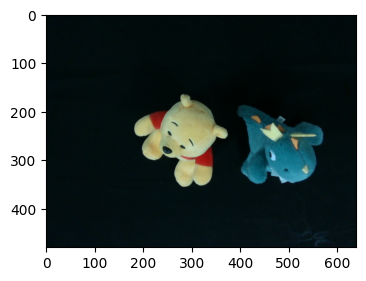

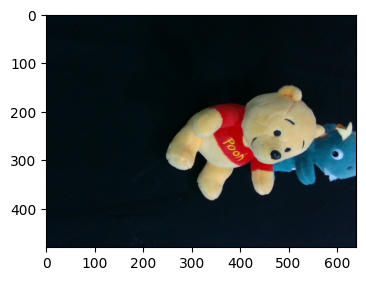

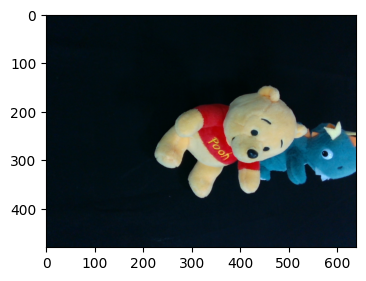

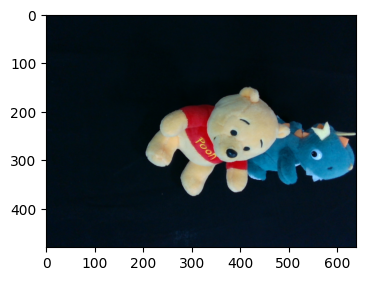

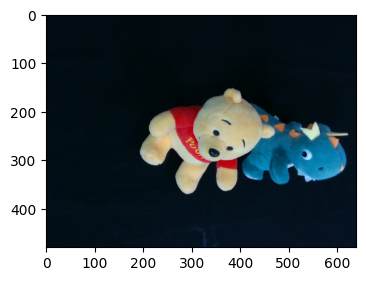

...

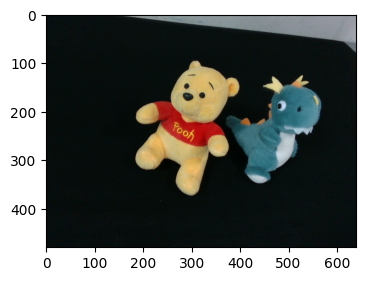

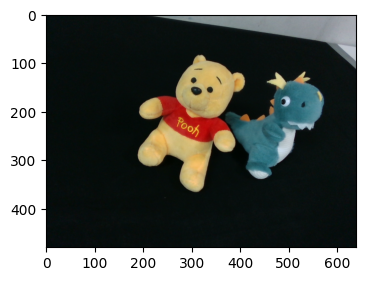

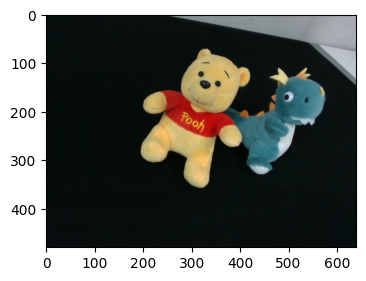

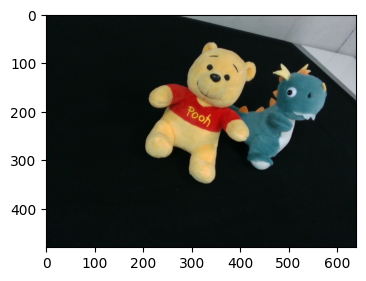

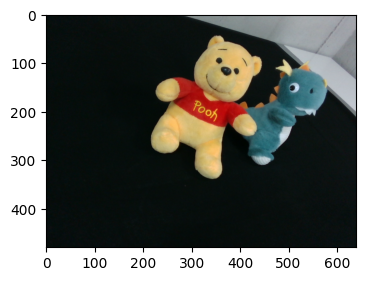

In [13]:
UR5_Control.observe_scene(scene_name+"2", view_angle_list, view_retrieve_list, print_result=True)

In [ ]:
scene_num = 2
# (Again) RGBs => Masks
num_objects = scene_processing( 
    scene_name, scene_num,
    sfm_type=sfm_type,
    dataset_path=dataset_path,
)
# (Again) RGBs + Masks + Camera Infos => Object Point-Clouds
source_pointclouds = generate_pointcloud( 
        scene_name, scene_num, num_objects,
        pointcloud_name="origin_points",
        dataset_path=dataset_path,
)

### Step 4: Merge Two Point-Clouds

In [15]:
from Functions.merge_funcs import merge_two_pointclouds
from Functions.score_funcs import get_pcd_score

In [16]:
target_name = "origin_points"

for object_idx in range(num_objects):
    # merget two point-clouds
    merged_points, _ = merge_two_pointclouds(
        source_data=source_pointclouds["object{}".format(object_idx+1)]["pcd"],
        target_data=target_pointclouds["object{}".format(object_idx+1)]["pcd"],
        source_camera_path="{}/{}{}".format(dataset_path, scene_name, scene_num),
        target_camera_path="{}/{}1".format(dataset_path, scene_name),
        merge_method=merge_type,
    )
    # calculate the completeness score of the initial point-cloud
    old_object_score = get_pcd_score(
        target_pointclouds["object{}".format(object_idx+1)]["pcd"],
        camera_path="{}/{}1/object_{}/cameras.json".format(dataset_path, scene_name, object_idx+1),
        pcd_path="{}/{}1/object_{}".format(dataset_path, scene_name, object_idx+1),
        consider_cameras=True,
        save_pcd=False,
    )
    # calculate the completeness score of the merged point-cloud
    new_object_score = get_pcd_score(
        merged_points,
        camera_path="{}/{}{}/object_{}/cameras.json".format(dataset_path, scene_name, scene_num, object_idx+1),
        pcd_path="{}/{}{}/object_{}".format(dataset_path, scene_name, scene_num, object_idx+1),
        consider_cameras=True,
    )
    print("* Merged-Object{}-Score: {:.3f} -> {:.3f}".format(object_idx+1, old_object_score, new_object_score))
    
    # save the merged point-cloud
    merging_name = "merged_points_step{}".format(scene_num-1)
    save_path = "{}/{}1/object_{}".format(dataset_path, scene_name, object_idx+1)
    np.save("{}/{}.npy".format(save_path, merging_name), merged_points)
    
    pcd_tmp = o3d.geometry.PointCloud()
    pcd_tmp.points = o3d.utility.Vector3dVector(merged_points[:,:3])
    o3d.io.write_point_cloud("{}/{}.ply".format(save_path, merging_name), pcd_tmp)

    # convert the merged point-cloud to the 3D textured mesh
    merged_torch = torch.from_numpy(merged_points).to("cuda:0")
    generate_mesh(merged_torch, save_path, merging_name)
    convert_mesh(save_path, merging_name)

/home/ur-plusle/minjae/ARIC_Code/References/Lepard/lib/trainer.py:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(resume)
Mesh cleaning: 100%|██████████